#  ## IBM Data Science Professional - Course Capstone 
  Kate Rees; July 2020
 

In [2]:
# Install libraries required for project 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

!pip install geopandas

import geopandas as gpd

!pip install folium
import folium 

import matplotlib.cm as cm
import matplotlib.colors as colors




     |████████████████████████████████| 972kB 7.1MB/s eta 0:00:01
     |████████████████████████████████| 14.8MB 27.2MB/s eta 0:00:01
     |████████████████████████████████| 10.9MB 34.5MB/s eta 0:00:01
     |████████████████████████████████| 1.0MB 35.4MB/s eta 0:00:01
     |████████████████████████████████| 102kB 7.4MB/s ta 0:00:011


## 1: Load and clean London house price data

In [3]:
#London House price data is obtainable from the following url:

url = 'https://data.london.gov.uk/download/average-house-prices/59be940c-ffb8-426d-a833-6146ea77de5c/land-registry-house-prices-ward.csv'
housing = pd.read_csv(url) #read the london Housing data into a Pandas dataframe

housing.head() #examine the dataframe



,Code,Ward_name,Borough,Year,Measure,Value
0,E09000001,City of London,City of London,Year ending Dec 1995,Median,-
1,E05000026,Abbey,Barking and Dagenham,Year ending Dec 1995,Median,"53,000"
2,E05000027,Alibon,Barking and Dagenham,Year ending Dec 1995,Median,"45,000"
3,E05000028,Becontree,Barking and Dagenham,Year ending Dec 1995,Median,"49,000"
4,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 1995,Median,"59,000"


In [4]:
hous = housing[housing['Year'].str.contains('Dec 2017')] 
#This data is updated quarterly, so we want just the latest update in December 2017

In [5]:
hous.head()

,Code,Ward_name,Borough,Year,Measure,Value
55440,E09000001,City of London,City of London,Year ending Dec 2017,Median,-
55441,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,"231,000"
55442,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,"295,000"
55443,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,"300,000"
55444,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,"310,000"


There are no values for 'City of London' so let's remove those.

In [6]:
hous = hous[hous["Ward_name"] != 'City of London'] 

hous.head()

,Code,Ward_name,Borough,Year,Measure,Value
55441,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,"231,000"
55442,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,"295,000"
55443,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,"300,000"
55444,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,"310,000"
55445,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Median,"331,500"


In [7]:
hous.dtypes # check the data types in the dataframe

Code         object
Ward_name    object
Borough      object
Year         object
Measure      object
Value        object
dtype: object

In [8]:
# the Value is stored as a string. Let's change this to integer to enable mathematical operations over this data.

hous['Value'] = hous['Value'].str.replace(',', '').astype(float)

In [9]:
hous.dtypes # re-check data types 

Code          object
Ward_name     object
Borough       object
Year          object
Measure       object
Value        float64
dtype: object

The data also contans two measures, the Median and Mean house prices for each Ward.  We need to decide which is the best metric for our analysis

In [10]:
# Divide the Mean and Median figures into two dataframes so we can compare them: 

housMean = hous[hous['Measure'].str.match('Mean')]
housMed = hous[hous['Measure'].str.match('Median')]


In [11]:
housMean.head()

,Code,Ward_name,Borough,Year,Measure,Value
111511,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Mean,259487.0
111512,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Mean,283397.0
111513,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Mean,291677.0
111514,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Mean,302849.0
111515,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Mean,326229.0


In [12]:
housMed.head()

,Code,Ward_name,Borough,Year,Measure,Value
55441,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,231000.0
55442,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,295000.0
55443,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,300000.0
55444,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,310000.0
55445,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Median,331500.0


We can see that the values are slightly different in each case - let's explore this further to see which will be best to use:

### Histogram plots  of the Mean and Median 
These plots will show the distribution of values for both the mean and median

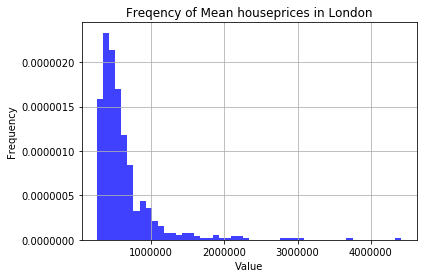

In [13]:
x  = housMean['Value']

# the histogram of the data
n, bins, patches = plt.hist(x, 50, density=True, facecolor='blue', alpha=0.75)


plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Freqency of Mean houseprices in London')
plt.grid(True)
plt.show()



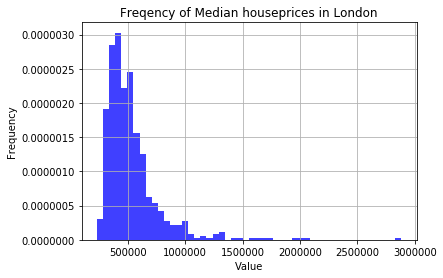

In [14]:
x  = housMed['Value']

# the histogram of the data
n, bins, patches = plt.hist(x, 50, density=True, facecolor='blue', alpha=0.75)


plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Freqency of Median houseprices in London')
plt.grid(True)
plt.show()

Both show a skewed distribution, in which case the median is usually preferred as it will be less affected by outliers in the data - e.g. a few very expensive houses.  


It may also be useful to use the logarithmic product of the value - as this will 'consense' the spread of the values. 


In [15]:
housMed['log_val'] =  np.log2(housMed['Value'])

housMed.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,Code,Ward_name,Borough,Year,Measure,Value,log_val
55441,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,231000.0,17.817533
55442,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,295000.0,18.170355
55443,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,300000.0,18.194603
55444,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,310000.0,18.241909
55445,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Median,331500.0,18.338649


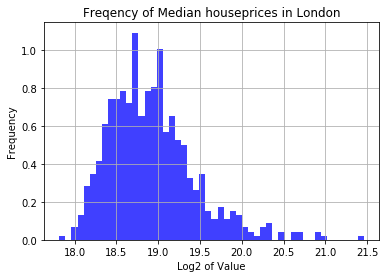

In [16]:
x  = housMed['log_val']

# the histogram of the data
n, bins, patches = plt.hist(x, 50, density=True, facecolor='blue', alpha=0.75)


plt.xlabel('Log2 of Value')
plt.ylabel('Frequency')
plt.title('Freqency of Median houseprices in London')
plt.grid(True)
plt.show()

In [17]:
housMed.Value.describe()  #Let's have a look at the house value data in more detail 

count    6.290000e+02
mean     5.355430e+05
std      2.546173e+05
min      2.310000e+05
25%      3.850000e+05
50%      4.750000e+05
75%      6.000000e+05
max      2.882600e+06
Name: Value, dtype: float64

### Set value bins:
It will be useful to set bins for the value using pandas' qcut function - we will set quintiles, i.e. 5 bins of equal size.  This will help to account for extreme outliers - a few very expensive properties that cause the distribution graph to be skewed, and will mean we won't have to use the log product.

In [18]:
# set bins to categorise house prices - this should also counteract any extreme outliers 

housMed['Value_Bins'] = pd.qcut(housMed.Value,q=5,labels=['Lowest','Low','Medium','High','Very High'])
housMed.head(10)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,Code,Ward_name,Borough,Year,Measure,Value,log_val,Value_Bins
55441,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,231000.0,17.817533,Lowest
55442,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,295000.0,18.170355,Lowest
55443,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,300000.0,18.194603,Lowest
55444,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,310000.0,18.241909,Lowest
55445,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Median,331500.0,18.338649,Lowest
55446,E05000031,Eastbury,Barking and Dagenham,Year ending Dec 2017,Median,313500.0,18.258106,Lowest
55447,E05000032,Gascoigne,Barking and Dagenham,Year ending Dec 2017,Median,269000.0,18.037247,Lowest
55448,E05000033,Goresbrook,Barking and Dagenham,Year ending Dec 2017,Median,297000.0,18.180103,Lowest
55449,E05000034,Heath,Barking and Dagenham,Year ending Dec 2017,Median,295000.0,18.170355,Lowest
55450,E05000035,Longbridge,Barking and Dagenham,Year ending Dec 2017,Median,430000.0,18.713977,Low


In [19]:
housMed['Value_Bins'].value_counts()  # prove that there are equal bins


Very High    126
High         126
Low          126
Lowest       126
Medium       125
Name: Value_Bins, dtype: int64

We can see that the log of the houses prices produces a histogram closer to a normal distribution.

## Obtaining London Geo data

Let's now combine this dataset with London geo data to enable us to plot these on a map:


In [20]:
import urllib.request
url = 'https://raw.githubusercontent.com/ft-interactive/geo-data/master/uk/london/london-wards-2014.geojson'
filename = 'lon.json'
urllib.request.urlretrieve(url, filename)

('lon.json', <http.client.HTTPMessage at 0x7ffb7da854e0>)

In [21]:
# Define London Start coords

lat = 51.508
long = -0.128

In [22]:
lon_geo = 'lon.json'

Let's use our house price data to generate a Choropleth map showing 

In [23]:
bins = list(housMed['Value'].quantile([0, 0.2, 0.4, 0.6, 0.8, 1]))


lon_map = folium.Map(location=[lat, long], zoom_start=10, width=800,height=600)

# generate choropleth map 
lon_map.choropleth(
    geo_data='lon.json',
    data=housMed,
    name='choropleth',
    columns=['Code','Value'],
    key_on='feature.properties.gss_code_ward',  # we will use the Code and gss_code_ward as our pair to join on, to account for any spelling differences in the Ward names
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='House Prices in Greater London',
    bins = bins
)

# display map

lon_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Installing GeoPandas for some more options to manipulate the GeoJson to work with Foursquare!

We will use geopandas to find the centroid of each ward polygon:

In [24]:
import geopandas as gpd


In [25]:
london_gpd = gpd.read_file(lon_geo)  #read the geojson into a geopandas dataframe

In [26]:

london_gpd.head()

,ward,gss_code_ward,gss_code_borough,borough,geometry
0,Chessington South,E05000405,E09000021,Kingston upon Thames,"POLYGON ((-0.33068 51.32901, -0.33059 51.32909..."
1,Tolworth and Hook Rise,E05000414,E09000021,Kingston upon Thames,"POLYGON ((-0.30846 51.37586, -0.30834 51.37606..."
2,Berrylands,E05000401,E09000021,Kingston upon Thames,"POLYGON ((-0.30385 51.39249, -0.30375 51.39252..."
3,Alexandra,E05000400,E09000021,Kingston upon Thames,"POLYGON ((-0.26990 51.38845, -0.26975 51.38838..."
4,Beverley,E05000402,E09000021,Kingston upon Thames,"POLYGON ((-0.24662 51.39921, -0.24672 51.39921..."


In [27]:
london_gpd.crs # Check which co-ordinate reference system we are using - it's WGS 84.

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Finding the Centroid of each Ward

We could not find a dataset with Lat/Longs of each of the London Wards.  Therefore we will try to use the geoJSON's polygons to approximate a centroid of each Ward. 

We have formatted the GeoJSON as a geopandas dataframe.  We can use the centroid function in geopandas to find the centroid of each polygon, and then use the gss_code_ward column as a key to join it back to our housing data.

In [28]:
#Find the center point
london_gpd['Center_point'] = london_gpd['geometry'].centroid

#Extract lat and lon from the centerpoint
london_gpd["long"] = london_gpd.Center_point.map(lambda p: p.x)
london_gpd["lat"] = london_gpd.Center_point.map(lambda p: p.y)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  from ipykernel import kernelapp as app


In [29]:
london_gpd.head()

,ward,gss_code_ward,gss_code_borough,borough,geometry,Center_point,long,lat
0,Chessington South,E05000405,E09000021,Kingston upon Thames,"POLYGON ((-0.33068 51.32901, -0.33059 51.32909...",POINT (-0.31203 51.34797),-0.312027,51.347966
1,Tolworth and Hook Rise,E05000414,E09000021,Kingston upon Thames,"POLYGON ((-0.30846 51.37586, -0.30834 51.37606...",POINT (-0.28990 51.37427),-0.289905,51.374269
2,Berrylands,E05000401,E09000021,Kingston upon Thames,"POLYGON ((-0.30385 51.39249, -0.30375 51.39252...",POINT (-0.28946 51.39265),-0.289457,51.392646
3,Alexandra,E05000400,E09000021,Kingston upon Thames,"POLYGON ((-0.26990 51.38845, -0.26975 51.38838...",POINT (-0.27527 51.38389),-0.275273,51.383887
4,Beverley,E05000402,E09000021,Kingston upon Thames,"POLYGON ((-0.24662 51.39921, -0.24672 51.39921...",POINT (-0.25894 51.40274),-0.258938,51.402740


In [30]:
london_merged = pd.merge(housMed, london_gpd, left_on='Code', right_on='gss_code_ward')  #we use the GSS code for the Ward as the Key - taking into account that it's named differently in each table

In [31]:
london_merged.head()

,Code,Ward_name,Borough,Year,Measure,Value,log_val,Value_Bins,ward,gss_code_ward,gss_code_borough,borough,geometry,Center_point,long,lat
0,E05000026,Abbey,Barking and Dagenham,Year ending Dec 2017,Median,231000.0,17.817533,Lowest,Abbey,E05000026,E09000002,Barking and Dagenham,"POLYGON ((0.06937 51.54413, 0.06946 51.54411, ...",POINT (0.07793 51.53971),0.077935,51.539711
1,E05000027,Alibon,Barking and Dagenham,Year ending Dec 2017,Median,295000.0,18.170355,Lowest,Alibon,E05000027,E09000002,Barking and Dagenham,"POLYGON ((0.13190 51.54376, 0.13208 51.54383, ...",POINT (0.14827 51.54559),0.148270,51.545589
2,E05000028,Becontree,Barking and Dagenham,Year ending Dec 2017,Median,300000.0,18.194603,Lowest,Becontree,E05000028,E09000002,Barking and Dagenham,"POLYGON ((0.10743 51.55200, 0.10757 51.55204, ...",POINT (0.11896 51.55453),0.118957,51.554534
3,E05000029,Chadwell Heath,Barking and Dagenham,Year ending Dec 2017,Median,310000.0,18.241909,Lowest,Chadwell Heath,E05000029,E09000002,Barking and Dagenham,"POLYGON ((0.13003 51.57075, 0.12999 51.57080, ...",POINT (0.13999 51.58475),0.139985,51.584751
4,E05000030,Eastbrook,Barking and Dagenham,Year ending Dec 2017,Median,331500.0,18.338649,Lowest,Eastbrook,E05000030,E09000002,Barking and Dagenham,"POLYGON ((0.16157 51.54333, 0.16156 51.54378, ...",POINT (0.17358 51.55365),0.173581,51.553648


In [32]:
# let's clean this up to keep only the columns that we'll need: 

london_merged.drop(columns=['Year','Measure','ward','gss_code_ward','gss_code_borough','borough','geometry','Center_point'], inplace=True)

london_merged.head()

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat
0,E05000026,Abbey,Barking and Dagenham,231000.0,17.817533,Lowest,0.077935,51.539711
1,E05000027,Alibon,Barking and Dagenham,295000.0,18.170355,Lowest,0.148270,51.545589
2,E05000028,Becontree,Barking and Dagenham,300000.0,18.194603,Lowest,0.118957,51.554534
3,E05000029,Chadwell Heath,Barking and Dagenham,310000.0,18.241909,Lowest,0.139985,51.584751
4,E05000030,Eastbrook,Barking and Dagenham,331500.0,18.338649,Lowest,0.173581,51.553648


In [33]:
london_merged.shape

(629, 8)

In [34]:
london_merged[london_merged.Code == 'E05000290']

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat
266,E05000290,Harrow Weald,Harrow,483500.0,18.883156,Medium,-0.34696,51.614436


754	E05000117	Darwin	Bromley	523500.0	18.997830	High	0.057218	51.327151	NaN	NaN	NaN	NaN	NaN	NaN	left_only
3945	E05000290	Harrow Weald	Harrow	483500.0	18.883156	Medium	-0.346960	51.614436	NaN	NaN	NaN	NaN	NaN	NaN	left_only
3959	E05000292	Headstone North	Harrow	600000.0	19.194603	High	-0.364077	51.594308	NaN	NaN	NaN	NaN	NaN	NaN	left_only
4013	E05000303	Stanmore Park	Harrow	615000.0	19.230227	High	-0.324799	51.618134	NaN	NaN	NaN	NaN	NaN	NaN	left_only
4156	E05000330	Harefield	Hillingdon	414000.0	18.659271	Low	-0.476235	51.598469	NaN	NaN	NaN	NaN	NaN	NaN	left_only
5929	E05000400	Alexandra	Kingston upon Thames	553500.0	19.078224	High	-0.275273	51.383887	NaN	NaN	NaN	NaN	NaN	NaN	left_only
6010	E05000406	Coombe Hill	Kingston upon Thames	650000.0	19.310080	Very High	-0.264684	51.421768	NaN	NaN	NaN	NaN	NaN	NaN	left_only
7333	E05000498	Chadwell	Redbridge	357500.0	18.447584	Lowest	0.123527	51.575276	NaN	NaN	NaN	NaN	NaN	NaN	left_only
9586	E05000629

This now has the lat longs in a format that we can use with the Foursquare API!

# Part 2: Querying the Foursquare API

In [35]:
CLIENT_ID = 'TSQ1CMHPJEE1OUFFX40T3OHLZEBBWGF12CBNY1QNAYG23QXF' # your Foursquare ID
CLIENT_SECRET = 'S1AWD5FWMJLYABMJ1LSHZU1GMTQUM5B4H5EGZQSTIGFWXN5D' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: TSQ1CMHPJEE1OUFFX40T3OHLZEBBWGF12CBNY1QNAYG23QXF
CLIENT_SECRET:S1AWD5FWMJLYABMJ1LSHZU1GMTQUM5B4H5EGZQSTIGFWXN5D


In [36]:
import json # library to handle JSON files

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe


In [37]:
def getNearbyVenues(names, borough, code, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, borough, code, lat, lng in zip(names, borough, code, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            borough,
            code,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Ward_name',
                             'Borough',
                             'Code',
                  'Ward Latitude', 
                  'Ward Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [40]:
london_venues = getNearbyVenues(names=london_merged['Ward_name'],
                                borough = london_merged['Borough'],
                                code = london_merged['Code'],
                                latitudes=london_merged['lat'],
                                longitudes=london_merged['long']
                                    
                                  )



Abbey
Alibon
Becontree
Chadwell Heath
Eastbrook
Eastbury
Gascoigne
Goresbrook
Heath
Longbridge
Mayesbrook
Parsloes
River
Thames
Valence
Village
Whalebone
Brunswick Park
Burnt Oak
Childs Hill
Colindale
Coppetts
East Barnet
East Finchley
Edgware
Finchley Church End
Garden Suburb
Golders Green
Hale
Hendon
High Barnet
Mill Hill
Oakleigh
Totteridge
Underhill
West Finchley
West Hendon
Woodhouse
Barnehurst
Belvedere
Blackfen and Lamorbey
Blendon and Penhill
Brampton
Christchurch
Colyers
Crayford
Cray Meadows
Danson Park
East Wickham
Erith
Falconwood and Welling
Lesnes Abbey
Longlands
North End
Northumberland Heath
St Mary's
St Michael's
Sidcup
Thamesmead East
Alperton
Barnhill
Brondesbury Park
Dollis Hill
Dudden Hill
Fryent
Harlesden
Kensal Green
Kenton
Kilburn
Mapesbury
Northwick Park
Preston
Queens Park
Queensbury
Stonebridge
Sudbury
Tokyngton
Welsh Harp
Wembley Central
Willesden Green
Bickley
Biggin Hill
Bromley Common and Keston
Bromley Town
Chelsfield and Pratts Bottom
Chislehurst
Clock 

In [41]:
london_venues.head()

,Ward_name,Borough,Code,Ward Latitude,Ward Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey,Barking and Dagenham,E05000026,51.539711,0.077935,Cristina's,51.536523,0.076672,Steakhouse
1,Abbey,Barking and Dagenham,E05000026,51.539711,0.077935,Nando's,51.539780,0.082297,Portuguese Restaurant
2,Abbey,Barking and Dagenham,E05000026,51.539711,0.077935,The Gym London Barking,51.536193,0.078601,Gym
3,Abbey,Barking and Dagenham,E05000026,51.539711,0.077935,Subway,51.538000,0.081319,Sandwich Place
4,Abbey,Barking and Dagenham,E05000026,51.539711,0.077935,Boots,51.538888,0.080724,Pharmacy


In [42]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 413 uniques categories.


In [43]:
print('There are results for {} Wards'.format(len(london_venues['Code'].unique())))



There are results for 620 Wards


### One Hot Encoding

In [44]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood code back to dataframe - we will use this later to join back to the borough information

london_onehot['Code'] = london_venues['Code']

# move Ward name column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,E05000026,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,E05000026,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,E05000026,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,E05000026,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,E05000026,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
london_onehot.shape

(10725, 414)

In [46]:
london_grouped = london_onehot.groupby('Code').mean().reset_index()  #Group by Ward code
london_grouped.head()

,Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,E05000026,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,E05000027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,E05000028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,E05000029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,E05000030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To create our 'y' values for the machine learning step, we need the 'Value_Bins' as a series. We can use london_merged for this, but we need to exclude the 9 missing values that we don't have data for. to get this series, we'll use a LEFT join between london_grouped and london_merged, which will give us the right values.

We can then convert the categorial values into a number series 1-5  which will work with the ML algorithms.

In [47]:
ys = pd.merge(london_grouped, london_merged, how='left', on="Code")

ys.head()

,Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,...,Yoga Studio,Zoo,Zoo Exhibit,Ward_name,Borough,Value,log_val,Value_Bins,long,lat
0,E05000026,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Abbey,Barking and Dagenham,231000.0,17.817533,Lowest,0.077935,51.539711
1,E05000027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Alibon,Barking and Dagenham,295000.0,18.170355,Lowest,0.148270,51.545589
2,E05000028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Becontree,Barking and Dagenham,300000.0,18.194603,Lowest,0.118957,51.554534
3,E05000029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Chadwell Heath,Barking and Dagenham,310000.0,18.241909,Lowest,0.139985,51.584751
4,E05000030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Eastbrook,Barking and Dagenham,331500.0,18.338649,Lowest,0.173581,51.553648


In [48]:
y = ys['Value_Bins'].values


new_labels = {'Lowest' : 1, 'Low' : 2, 'Medium' : 3, 'High' : 4, 'Very High' : 5}

y = (pd.Series(y)).map(new_labels) #convert the list to a pandas series temporarily before mapping

y.shape


(620,)

In [49]:
X = london_grouped.drop(columns="Code")

X.shape

(620, 413)

###  Split into Test and Train to test Machine Learning methodologies

In [50]:
# split into trainig and test set: 

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [51]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (496, 413) (496,)
Test set: (124, 413) (124,)


#### Train/Test K means  for different values of K

In [52]:
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)

    
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])

mean_acc

array([0.33870968, 0.31451613, 0.2983871 , 0.36290323, 0.33870968,
       0.33064516, 0.36290323, 0.34677419, 0.2983871 ])

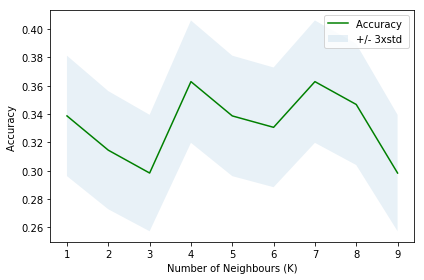

In [53]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbours (K)')
plt.tight_layout()
plt.show()

In [54]:
print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

The best accuracy was with 0.3629032258064516 with k= 4


This is quite a poor accurate rate - let's try some other methods of ML to see if we get a better response

### Decision Tree using scikit learn
Let's see if using a decision tree could give us a better classifier

In [55]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier


In [56]:
maxdepth = 20

acc = np.zeros((maxdepth-1))

for n in range(1,maxdepth):
    

    #Train Model and Predict  
    lonTree = DecisionTreeClassifier(criterion="entropy", max_depth = n)
    lonTree.fit(X_train,y_train)
    predTree = lonTree.predict(X_test)
    acc[n-1] =  metrics.accuracy_score(y_test, predTree)

acc

array([0.37096774, 0.36290323, 0.38709677, 0.37096774, 0.34677419,
       0.33870968, 0.33064516, 0.31451613, 0.2983871 , 0.2983871 ,
       0.28225806, 0.30645161, 0.29032258, 0.30645161, 0.29032258,
       0.2983871 , 0.32258065, 0.29032258, 0.27419355])

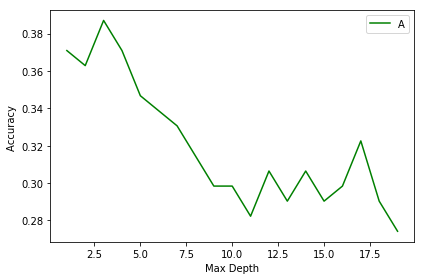

In [57]:
plt.plot(range(1,maxdepth),acc,'g')
plt.legend('Accuracy ')
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()

In [58]:
print( "The best accuracy was with", acc.max(), "with a tree max depth of ", acc.argmax()+1) 

The best accuracy was with 0.3870967741935484 with a tree max depth of  3


A max depth of 2, plus a still low max accuracy indicates this is still a poor choice for machine learning

#### Support Vector Machine

In [59]:
from sklearn import svm
SVM_model = svm.SVC()
SVM_model.fit(X_train, y_train) 

/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [60]:
yhat = SVM_model.predict(X_test)
yhat

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [61]:
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

In [62]:
print("SVM Jaccard index: %.2f" % jaccard_similarity_score(y_test, yhat))
print("SVM F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )

SVM Jaccard index: 0.15
SVM F1-score: 0.04


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Create a dataframe of the top 10 venue categories in each Ward

In [63]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [64]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
lon_venues_sorted = pd.DataFrame(columns=columns)
lon_venues_sorted['Code'] = london_grouped['Code']

for ind in np.arange(london_grouped.shape[0]):
    lon_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_grouped.iloc[ind, :], num_top_venues)

lon_venues_sorted.head()

,Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E05000026,Grocery Store,Fast Food Restaurant,Café,Discount Store,Gym,Sandwich Place,Pizza Place,Platform,Coffee Shop,Supermarket
1,E05000027,Grocery Store,Convenience Store,Coffee Shop,Supermarket,Pub,Metro Station,Sporting Goods Shop,Exhibit,Event Space,Filipino Restaurant
2,E05000028,Cosmetics Shop,Park,Doctor's Office,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
3,E05000029,English Restaurant,Grocery Store,Indian Restaurant,Restaurant,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
4,E05000030,Lake,Construction & Landscaping,Park,Fish & Chips Shop,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market


### Use K Means Clustering to group similar Wards

In [65]:
# import k-means from clustering stage
from sklearn.cluster import KMeans


In [66]:
london_grouped.head()

,Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,E05000026,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,E05000027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,E05000028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,E05000029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,E05000030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
# set number of clusters
kclusters = 4   #optimum vale of K 

london_grouped_clustering = london_grouped.drop('Code', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

# add clustering labels
lon_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


In [68]:
lon_venues_sorted.head()

,Cluster Labels,Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,E05000026,Grocery Store,Fast Food Restaurant,Café,Discount Store,Gym,Sandwich Place,Pizza Place,Platform,Coffee Shop,Supermarket
1,3,E05000027,Grocery Store,Convenience Store,Coffee Shop,Supermarket,Pub,Metro Station,Sporting Goods Shop,Exhibit,Event Space,Filipino Restaurant
2,1,E05000028,Cosmetics Shop,Park,Doctor's Office,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
3,3,E05000029,English Restaurant,Grocery Store,Indian Restaurant,Restaurant,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
4,1,E05000030,Lake,Construction & Landscaping,Park,Fish & Chips Shop,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market


In [69]:

# merge our London venues our house price and geo data) to add latitude/longitude for each neighborhood
london = pd.merge(london_merged, lon_venues_sorted, how="inner", on="Code")
london.head()

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E05000026,Abbey,Barking and Dagenham,231000.0,17.817533,Lowest,0.077935,51.539711,2,Grocery Store,Fast Food Restaurant,Café,Discount Store,Gym,Sandwich Place,Pizza Place,Platform,Coffee Shop,Supermarket
1,E05000027,Alibon,Barking and Dagenham,295000.0,18.170355,Lowest,0.148270,51.545589,3,Grocery Store,Convenience Store,Coffee Shop,Supermarket,Pub,Metro Station,Sporting Goods Shop,Exhibit,Event Space,Filipino Restaurant
2,E05000028,Becontree,Barking and Dagenham,300000.0,18.194603,Lowest,0.118957,51.554534,1,Cosmetics Shop,Park,Doctor's Office,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
3,E05000029,Chadwell Heath,Barking and Dagenham,310000.0,18.241909,Lowest,0.139985,51.584751,3,English Restaurant,Grocery Store,Indian Restaurant,Restaurant,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
4,E05000030,Eastbrook,Barking and Dagenham,331500.0,18.338649,Lowest,0.173581,51.553648,1,Lake,Construction & Landscaping,Park,Fish & Chips Shop,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market


In [167]:
london_x = london.loc[london['Value_Bins'] == 'Very High' ]

london_x

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
19,E05000045,Childs Hill,Barnet,640000.0,19.287712,Very High,-0.202648,51.565084,1,Park,Sushi Restaurant,Grocery Store,Food Truck,Italian Restaurant,Bus Stop,Health & Beauty Service,Hotel,Fast Food Restaurant,Farm
26,E05000052,Garden Suburb,Barnet,970000.0,19.887625,Very High,-0.183306,51.580972,1,Coffee Shop,Forest,Park,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
27,E05000053,Golders Green,Barnet,646000.0,19.301175,Very High,-0.212704,51.574816,2,Supermarket,Coffee Shop,Bakery,Beer Garden,Gym,Fish & Chips Shop,Factory,Falafel Restaurant,Farm,Farmers Market
31,E05000058,Oakleigh,Barnet,642500.0,19.293337,Very High,-0.170692,51.634317,2,Coffee Shop,Italian Restaurant,Supermarket,Café,Asian Restaurant,Hotel,Grocery Store,Sandwich Place,American Restaurant,Falafel Restaurant
61,E05000089,Dudden Hill,Brent,700000.0,19.416995,Very High,-0.241584,51.554218,2,Metro Station,Restaurant,Thai Restaurant,Portuguese Restaurant,Zoo Exhibit,Filipino Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
64,E05000092,Kensal Green,Brent,647500.0,19.304521,Very High,-0.236782,51.534979,2,Persian Restaurant,Pizza Place,Gymnastics Gym,Spanish Restaurant,Thai Restaurant,Café,Bus Stop,Plaza,Exhibit,Factory
70,E05000098,Queens Park,Brent,972250.0,19.890968,Very High,-0.213784,51.535166,2,Café,Indian Restaurant,Park,Grocery Store,Yoga Studio,Portuguese Restaurant,Restaurant,Bakery,Fast Food Restaurant,Garden
97,E05000126,Shortlands,Bromley,637500.0,19.282066,Very High,-0.001732,51.396437,1,Park,Coffee Shop,Locksmith,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
99,E05000128,Belsize,Camden,980000.0,19.902422,Very High,-0.166587,51.546106,2,Café,Convenience Store,Italian Restaurant,Pub,Deli / Bodega,Bakery,Hotel,Nature Preserve,Bagel Shop,Greek Restaurant
101,E05000130,Camden Town with Primrose Hill,Camden,970000.0,19.887625,Very High,-0.149107,51.540313,2,Pub,Café,Market,Coffee Shop,Burger Joint,Music Venue,Vegetarian / Vegan Restaurant,Flea Market,Grocery Store,Fish & Chips Shop


#### Map Clusters to show the geographic spread: 

In [70]:
import matplotlib.cm as cm
import matplotlib.colors as colors


In [134]:
# create map
map_clusters = folium.Map(location=[lat, long], zoom_start=10, height=400, width=600)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london['lat'], london['long'], london['Ward_name'], london['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=['blue','orange','green','red'][cluster],
        fill=True,
        fill_color=['blue','orange','green','red'][cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [139]:
lon_map2 = folium.Map(location=[lat, long], zoom_start=10, width=800,height=600)

# generate choropleth map 
lon_map2.choropleth(
    geo_data='lon.json',
    data=london,
    name='choropleth',
    columns=['Code','Cluster Labels'],
    key_on='feature.properties.gss_code_ward',  # we will use the Code and gss_code_ward as our pair to join on, to account for any spelling differences in the Ward names
    fill_color='Set1',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='House Prices in Greater London',
   
)

# display map

lon_map2

Let's divide our london_merged table into individual dataframes for each cluster so we can explore them further:

In [72]:
london_0 = london.loc[london['Cluster Labels'] == 0 ]

london_0.head()

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,E05000035,Longbridge,Barking and Dagenham,430000.0,18.713977,Low,0.096579,51.543838,0,Pharmacy,Pub,Pizza Place,Café,Zoo Exhibit,Film Studio,Exhibit,Factory,Falafel Restaurant,Farm
11,E05000037,Parsloes,Barking and Dagenham,300000.0,18.194603,Lowest,0.134974,51.550182,0,Pub,Sauna / Steam Room,Plaza,Zoo Exhibit,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
14,E05000040,Valence,Barking and Dagenham,308000.0,18.232571,Lowest,0.134158,51.560573,0,History Museum,Pub,Park,Outdoors & Recreation,Zoo Exhibit,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
30,E05000056,High Barnet,Barnet,500000.0,18.931569,Medium,-0.212531,51.654923,0,Coffee Shop,Bus Stop,Pub,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field
32,E05000059,Totteridge,Barnet,550000.0,19.069072,High,-0.201180,51.629865,0,Indian Restaurant,Church,Pub,Bus Stop,Café,Zoo Exhibit,Film Studio,Exhibit,Factory,Falafel Restaurant


In [159]:
london_1 = london.loc[london['Cluster Labels'] == 1 ]

london_1

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,E05000028,Becontree,Barking and Dagenham,300000.0,18.194603,Lowest,0.118957,51.554534,1,Cosmetics Shop,Park,Doctor's Office,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
4,E05000030,Eastbrook,Barking and Dagenham,331500.0,18.338649,Lowest,0.173581,51.553648,1,Lake,Construction & Landscaping,Park,Fish & Chips Shop,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
18,E05000044,Burnt Oak,Barnet,375000.0,18.516531,Low,-0.259675,51.603533,1,Chinese Restaurant,Health & Beauty Service,Park,Gym,Zoo Exhibit,Filipino Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
19,E05000045,Childs Hill,Barnet,640000.0,19.287712,Very High,-0.202648,51.565084,1,Park,Sushi Restaurant,Grocery Store,Food Truck,Italian Restaurant,Bus Stop,Health & Beauty Service,Hotel,Fast Food Restaurant,Farm
24,E05000050,Edgware,Barnet,600000.0,19.194603,High,-0.281736,51.626374,1,Music Store,Park,Café,Zoo Exhibit,Film Studio,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
25,E05000051,Finchley Church End,Barnet,625000.0,19.253497,High,-0.201174,51.596280,1,Park,Seafood Restaurant,Italian Restaurant,Smoke Shop,Doctor's Office,Coffee Shop,Filipino Restaurant,Event Space,Exhibit,Factory
26,E05000052,Garden Suburb,Barnet,970000.0,19.887625,Very High,-0.183306,51.580972,1,Coffee Shop,Forest,Park,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
45,E05000072,Cray Meadows,Bexley,340000.0,18.375175,Lowest,0.133513,51.423520,1,Park,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field
49,E05000077,Lesnes Abbey,Bexley,375000.0,18.516531,Low,0.129925,51.484305,1,Furniture / Home Store,Park,Bus Stop,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
54,E05000082,St Michael's,Bexley,391000.0,18.576809,Low,0.118435,51.470512,1,Bakery,Construction & Landscaping,Park,Gastropub,Zoo Exhibit,Fish & Chips Shop,Factory,Falafel Restaurant,Farm,Farmers Market


In [74]:
london_2 = london.loc[london['Cluster Labels'] == 2 ]

london_2.head()

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E05000026,Abbey,Barking and Dagenham,231000.0,17.817533,Lowest,0.077935,51.539711,2,Grocery Store,Fast Food Restaurant,Café,Discount Store,Gym,Sandwich Place,Pizza Place,Platform,Coffee Shop,Supermarket
6,E05000032,Gascoigne,Barking and Dagenham,269000.0,18.037247,Lowest,0.082947,51.532413,2,Gym,Supermarket,Turkish Restaurant,Café,BBQ Joint,Filipino Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
7,E05000033,Goresbrook,Barking and Dagenham,297000.0,18.180103,Lowest,0.135579,51.536090,2,Soccer Field,Gym / Fitness Center,Bowling Alley,Construction & Landscaping,Fast Food Restaurant,Movie Theater,Pizza Place,Zoo Exhibit,Film Studio,Factory
8,E05000034,Heath,Barking and Dagenham,295000.0,18.170355,Lowest,0.154339,51.557524,2,Bus Station,Supermarket,Pool,Construction & Landscaping,Martial Arts School,Food Court,Food Stand,Exhibit,Factory,Falafel Restaurant
12,E05000038,River,Barking and Dagenham,291000.0,18.150660,Lowest,0.152948,51.524330,2,Train Station,Platform,Zoo Exhibit,Filipino Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm


In [161]:
london_3 = london.loc[london['Cluster Labels'] == 3 ]

london_3.head()

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,E05000027,Alibon,Barking and Dagenham,295000.0,18.170355,Lowest,0.148270,51.545589,3,Grocery Store,Convenience Store,Coffee Shop,Supermarket,Pub,Metro Station,Sporting Goods Shop,Exhibit,Event Space,Filipino Restaurant
3,E05000029,Chadwell Heath,Barking and Dagenham,310000.0,18.241909,Lowest,0.139985,51.584751,3,English Restaurant,Grocery Store,Indian Restaurant,Restaurant,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
5,E05000031,Eastbury,Barking and Dagenham,313500.0,18.258106,Lowest,0.105683,51.535896,3,Auto Garage,Grocery Store,Metro Station,Pub,Zoo Exhibit,Film Studio,Exhibit,Factory,Falafel Restaurant,Farm
10,E05000036,Mayesbrook,Barking and Dagenham,295500.0,18.172799,Lowest,0.119170,51.544040,3,Grocery Store,Pub,Park,Café,Zoo Exhibit,Filipino Restaurant,Exhibit,Factory,Falafel Restaurant,Farm
15,E05000041,Village,Barking and Dagenham,307000.0,18.227879,Lowest,0.166279,51.539049,3,Bar,Grocery Store,Furniture / Home Store,Gas Station,Zoo Exhibit,Fish & Chips Shop,Factory,Falafel Restaurant,Farm,Farmers Market


In [145]:
lon0 = london_0.groupby('Value_Bins')['Code'].nunique()
lon1 = london_1.groupby('Value_Bins')['Code'].nunique()
lon2 = london_2.groupby('Value_Bins')['Code'].nunique()
lon3 = london_3.groupby('Value_Bins')['Code'].nunique()


colheads = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4']
print(colheads)

lon_counts = pd.concat([lon0,lon1,lon2,lon3], axis=1)


lon_counts.columns = colheads

lon_counts

['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']


,Cluster 1,Cluster 2,Cluster 3,Cluster 4
Value_Bins,,,,
Lowest,9,19,65,31
Low,14,13,68,30
Medium,18,9,71,26
High,17,13,84,8
Very High,14,7,96,8


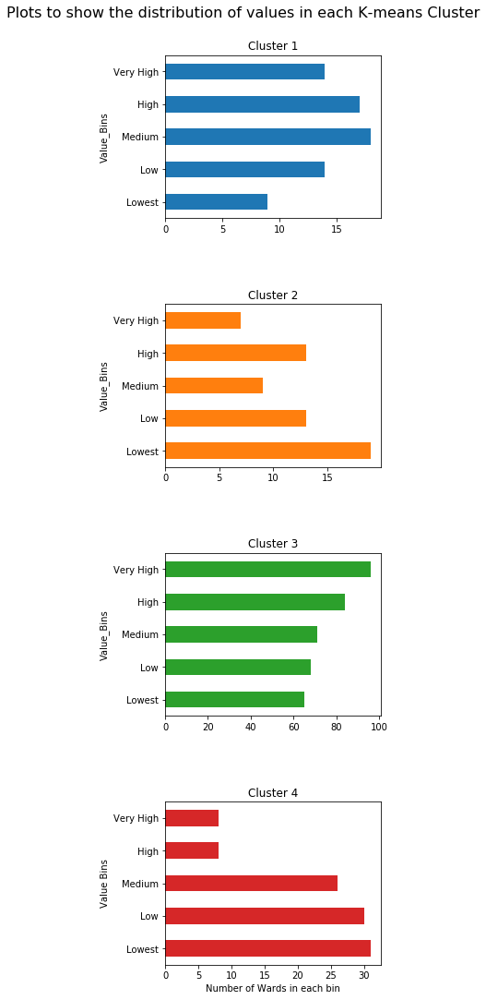

In [158]:
lon_counts.plot(kind='barh', subplots=True, layout=(4,1), rot=0, sharey=False, sharex=False, legend=False, figsize=(6,16))


plt.xlabel('Number of Wards in each bin')
plt.ylabel('Value Bins')
plt.tight_layout(pad=6.0)
plt.suptitle('Plots to show the distribution of values in each K-means Cluster', fontsize=16)
plt.show()




We can see from the above plots that: 

* lon 0  - skews towrds Medium/High
* lon 1 - skew towarsd Low value
* lon 2 - slight skew towards Very High  
* lon 3 - skews towards Very High/High


Lon 0, 3 and 4 do show some correlation, but lon1 and lon2 are weak indicators of the propery values in the cluster.   Let's now look to see if there is a better classifier for the data


In [78]:
london.head()  #refresh our minds about London dataframe:

,Code,Ward_name,Borough,Value,log_val,Value_Bins,long,lat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,E05000026,Abbey,Barking and Dagenham,231000.0,17.817533,Lowest,0.077935,51.539711,2,Grocery Store,Fast Food Restaurant,Café,Discount Store,Gym,Sandwich Place,Pizza Place,Platform,Coffee Shop,Supermarket
1,E05000027,Alibon,Barking and Dagenham,295000.0,18.170355,Lowest,0.148270,51.545589,3,Grocery Store,Convenience Store,Coffee Shop,Supermarket,Pub,Metro Station,Sporting Goods Shop,Exhibit,Event Space,Filipino Restaurant
2,E05000028,Becontree,Barking and Dagenham,300000.0,18.194603,Lowest,0.118957,51.554534,1,Cosmetics Shop,Park,Doctor's Office,Zoo Exhibit,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
3,E05000029,Chadwell Heath,Barking and Dagenham,310000.0,18.241909,Lowest,0.139985,51.584751,3,English Restaurant,Grocery Store,Indian Restaurant,Restaurant,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
4,E05000030,Eastbrook,Barking and Dagenham,331500.0,18.338649,Lowest,0.173581,51.553648,1,Lake,Construction & Landscaping,Park,Fish & Chips Shop,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market


In [79]:
# install wordcloud
!conda install -c conda-forge wordcloud==1.4.1 --yes

# import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS

print ('Wordcloud is installed and imported!')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - wordcloud==1.4.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    wordcloud-1.4.1            |           py36_0         324 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.7 MB

The following NEW packages will be INSTALLED:

    python_abi:      3.6-1_cp36m       conda-forge
    wordcloud:       1.4.1-py36_0      conda-forge

The following packages will be UPDATE

In [111]:
stopwords = set(STOPWORDS)

In [121]:
text_0 = london_0.filter(regex = 'Common Venue').values
text_1 = london_1.filter(regex = 'Common Venue').values
text_2 = london_2.filter(regex = 'Common Venue').values
text_3 = london_3.filter(regex = 'Common Venue').values

In [113]:
from PIL import Image
import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_79fe377527cd418c9330130621c60ebd = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='Qc6okPlvQylB7MYyIXBYlFQlLBVwQ4T_mkZ4Jocz3hKa',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3.eu-geo.objectstorage.service.networklayer.com')

# Your data file was loaded into a botocore.response.StreamingBody object.
# Please read the documentation of ibm_boto3 and pandas to learn more about the possibilities to load the data.
# ibm_boto3 documentation: https://ibm.github.io/ibm-cos-sdk-python/
# pandas documentation: http://pandas.pydata.org/
londonsky = client_79fe377527cd418c9330130621c60ebd.get_object(Bucket='capstoneproject-donotdelete-pr-4dd1yku4ua60xm', Key='londonsky.png')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(londonsky, "__iter__"): londonsky.__iter__ = types.MethodType( __iter__, londonsky ) 


In [127]:

mask = np.array(Image.open(londonsky.pnb))

AttributeError: 'StreamingBody' object has no attribute 'png'

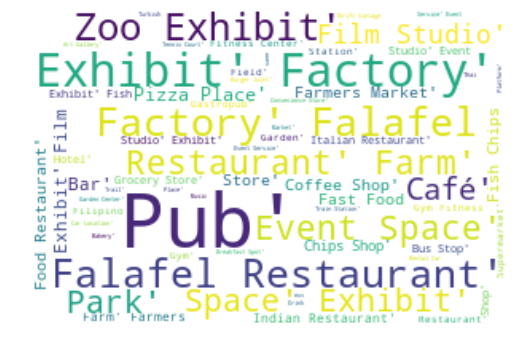

In [144]:
wordcloud = WordCloud(
    width = 300,
    height = 200,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_0))
fig = plt.figure(
    figsize = (7, 9),
    facecolor = 'white',
    edgecolor = 'white')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

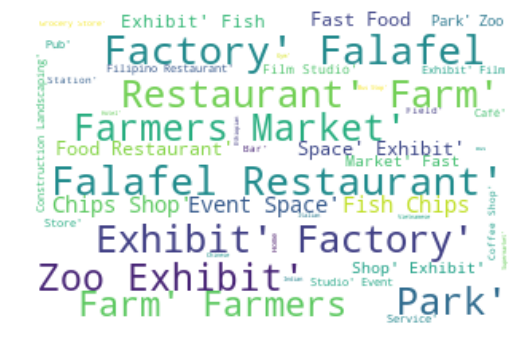

In [141]:
wordcloud = WordCloud(
    width = 300,
    height = 200,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_1))
fig = plt.figure(
    figsize = (7, 9),
    facecolor = 'white',
    edgecolor = 'white')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

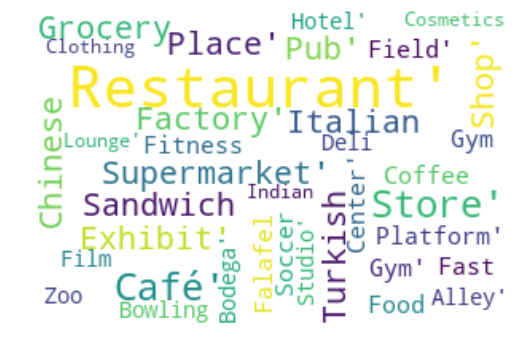

In [142]:
wordcloud = WordCloud(
    width = 300,
    height = 200,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_2))
fig = plt.figure(
    figsize = (7, 9),
    facecolor = 'white',
    edgecolor = 'white')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

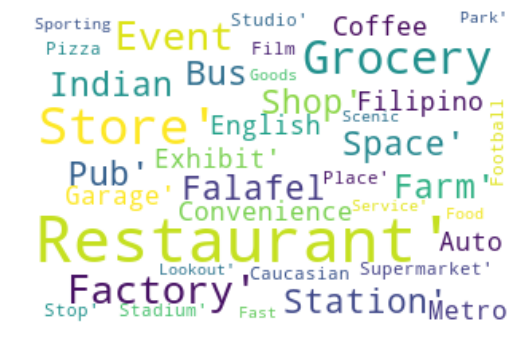

In [143]:
wordcloud = WordCloud(
    width = 300,
    height = 200,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_3))
fig = plt.figure(
    figsize = (7, 9),
    facecolor = 'white',
    edgecolor = 'white')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()